# Python programming- An overview

In [1]:
from IPython.core.display import display, HTML
from modules_summary import *

display(HTML('<style>.container { width:100% !important; }</style>'))

mpl.rcParams.update(mpl.rcParamsDefault)
%matplotlib inline
mpl.rcParams['font.size'] = 14
mpl.rcParams['figure.dpi'] = 90.

/opt/anaconda3/lib/python3.7/site-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.cluster.k_means_ module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.cluster. Anything that cannot be imported from sklearn.cluster is now part of the private API.
  warnings.warn(message, FutureWarning)
/opt/anaconda3/lib/python3.7/site-packages/pandas_datareader/compat/__init__.py:7: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  from pandas.util.testing import assert_frame_equal


The data is from 01/09/2020.


![python_motivation.png](python_motivation.png)

**Why Python?**

![python.png](python.png)

## Use Python for daily tasks of an experimental scientist
**Cleaning and analyzing data**

Import **growths curves of yellow fluorescent protein** measured at MBZ.

In [2]:
df = pd.read_csv('data/data_yfp.csv', delimiter='\t', index_col=0)
df.drop(labels='h', inplace=True)

df = df.apply(pd.to_numeric, errors='coerce')  # convert strings to floats
df.index = df.index.astype('float64')
df

,Intensity,Intensity.1,Intensity.2,Intensity.3,Intensity.4,Intensity.5,Intensity.6,Intensity.7,Intensity.8,Intensity.9,...,Intensity.490,Intensity.491,Intensity.492,Intensity.493,Intensity.494,Intensity.495,Intensity.496,Intensity.497,Intensity.498,Intensity.499
Total Time,,,,,,,,,,,,,,,,,,,,,
0.073881,0.098628,0.098837,0.099224,0.097253,0.095928,0.097049,0.096303,0.095819,0.096598,0.096845,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
0.147761,0.102551,0.100661,0.099841,0.100177,0.098442,0.096685,0.098249,0.097166,0.097727,0.096494,...,0.096025,0.097090,0.097416,0.096412,0.096937,0.097836,0.096700,0.098065,0.097839,0.097092
0.221642,0.103295,0.102464,0.099265,0.101733,0.100788,0.097834,0.098030,0.098730,0.098167,0.100857,...,0.097342,0.098458,0.097879,0.100090,0.098391,0.097887,0.100167,0.101792,0.103030,0.097615
0.295522,0.100106,0.100312,0.101372,0.096445,0.097046,0.096641,0.100299,0.099810,0.099787,0.095852,...,0.096708,0.098414,0.097844,0.098203,0.098600,0.096810,0.097592,0.097994,0.098381,0.097258
0.369403,0.102790,0.101377,0.102184,0.098781,0.095849,0.096211,0.097044,0.096458,0.101305,0.097823,...,0.097658,0.097090,0.096876,0.097324,0.096850,0.097416,0.097286,0.098088,0.096214,0.096506
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19.504478,0.532020,0.093638,0.093468,0.093468,0.676226,0.731157,0.740612,0.774836,0.742637,0.767923,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
19.578358,0.094415,0.261052,0.419724,0.484856,0.094647,0.095564,0.595205,0.643370,0.658926,0.561814,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
19.652239,0.910611,0.096160,0.096698,0.260571,0.641793,0.756942,0.745141,0.745141,0.763251,0.755105,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


The first column is the time in hours and the other columns are the 500 measured growth curves. We see at the end a lot of 'NaN', which means that the data isn't available and needs to be taken care of. First of all, let's plot the 500 curves.

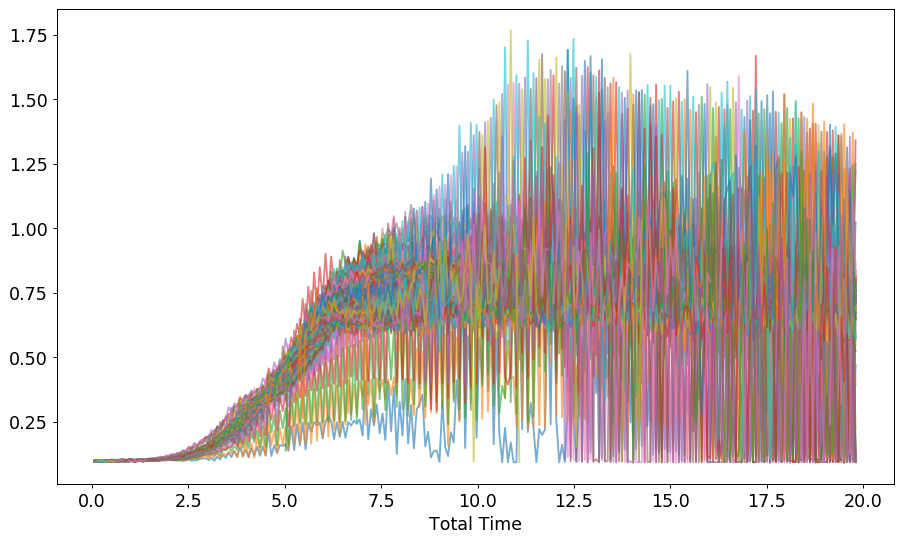

In [3]:
df.plot(kind='line', legend=False, figsize=(12, 7), alpha=0.6);

Really noisy, what about looking at some of them, for example the second one. 

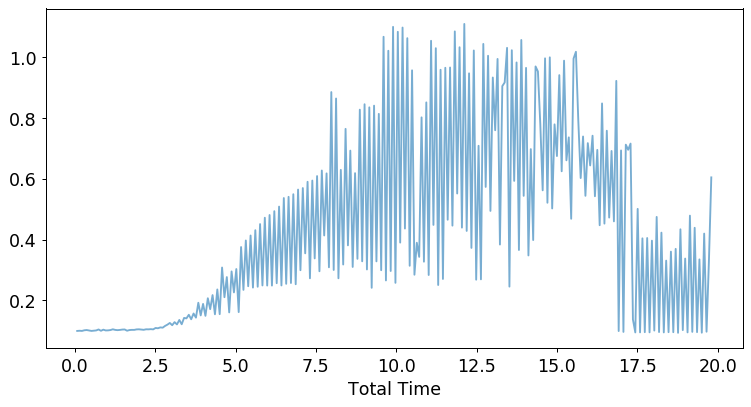

In [4]:
df.iloc[:, 2].plot(kind='line', legend=False, figsize=(10, 5), alpha=0.6);

Or the 299 growth curve.

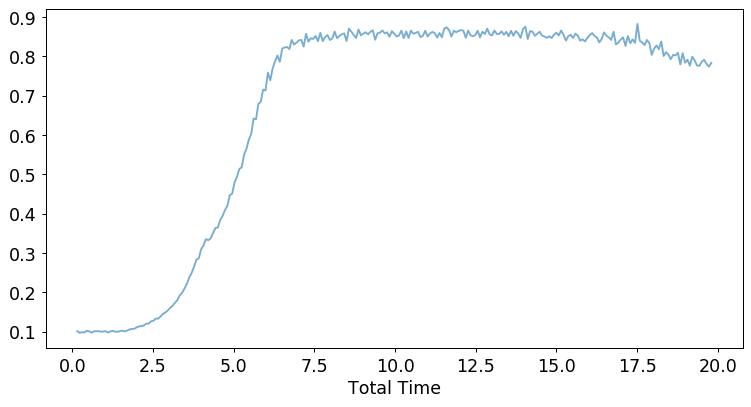

In [5]:
df.iloc[:, 299].plot(kind='line', legend=False, figsize=(10, 5), alpha=0.6);

We note that some of the curves are oscillating quite a lot. We are only interested in the ones that are relatively smooth. Let's take a look how they are distributed over the 500 measured curves.

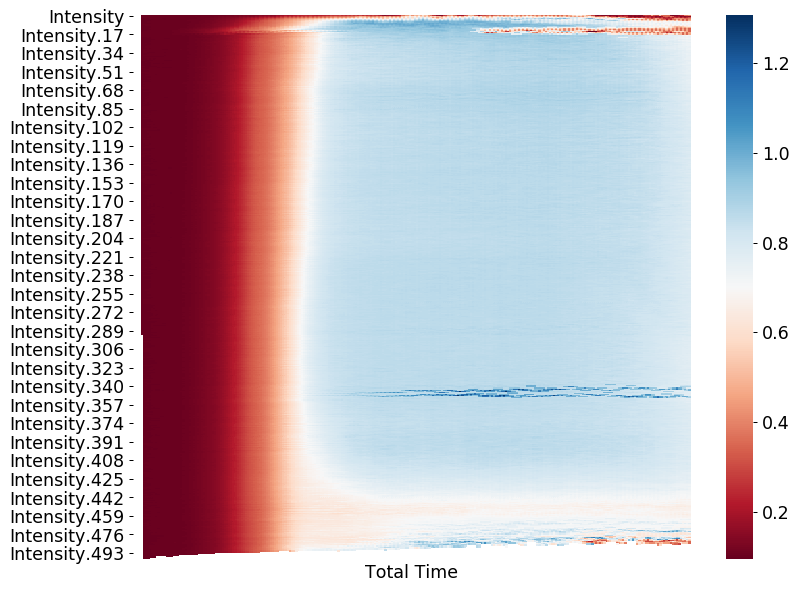

In [6]:
plt.figure(figsize=(10, 8))
res = sns.heatmap(df.iloc[:, :-1].rolling(5).mean().T,
                  cmap="RdBu",
                  xticklabels=False)

### Select 'good' curves and clean 'NaN'

By calculating the Pearson autocorrelation and selecting only curves with high autocorrelation, we are able to select 355 curves out of the 500.

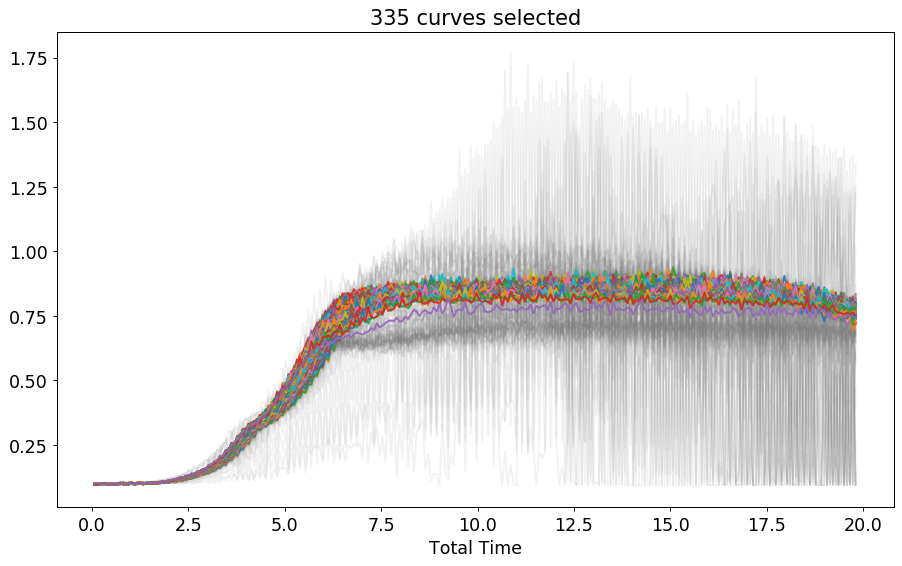

In [7]:
df = df.loc[:, df.isnull().sum(axis=0) < 10].copy()
df.interpolate(inplace=True, method='linear', limit_direction='both')

df_auto = df_autocorr(
    df, lag=5)  # Just choose curves with autocorrelation > thresh
thresh = 0.994  # choose this parameter that enough curves are contained

ax = df.plot(kind='line',
             legend=False,
             figsize=(12, 8),
             alpha=0.1,
             color='grey')

df.loc[:, df_auto[df_auto > thresh].index].plot(
    legend=False,
    figsize=(12, 7),
    alpha=0.9,
    ax=ax,
    title=f'{len(df_auto[df_auto > thresh].index)} curves selected');

Now we can go one **analyzing the bacteria growth curves**.

## Why Python? Analyze Google Searches

- **powerful** (modules, APIs)
- **popular?**

**How to check which are popular programming languages?**
  
  
**What has been searched on Google?** Let us check the popularity over the last 5 years of Java, Python, R and Fortran.

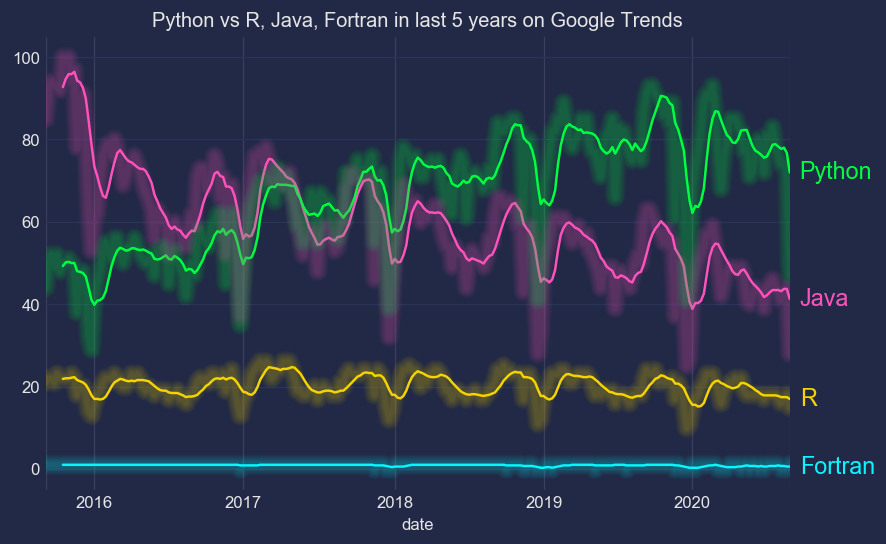

In [8]:
KEYWORDS = ['Java', 'Python', 'R', 'Fortran']
country = 'US'
time = 'today 5-y'

pytrend = TrendReq(hl='en-US', tz=360)
CODES = pd.DataFrame([pytrend.suggestions(keyword=i)[0] for i in KEYWORDS])
# build the payload
pytrend.build_payload(kw_list=CODES['mid'].values,
                      cat=0,
                      timeframe=time,
                      geo=country,
                      gprop='')

# get the interest over time
df2 = pytrend.interest_over_time()
df2 = df2.drop(labels=['isPartial'], axis='columns')
df2.columns = CODES['title'].values
colors = ['#FE53BB', '#00ff41', '#F5D300', '#08F7FE']  # matrix green
plt.style.use("seaborn-dark")
mpl.rcParams['font.size'] = 10
mpl.rcParams['figure.dpi'] = 120.
for param in ['figure.facecolor', 'axes.facecolor', 'savefig.facecolor']:
    plt.rcParams[param] = '#212946'  # bluish dark grey
for param in ['text.color', 'axes.labelcolor', 'xtick.color', 'ytick.color']:
    plt.rcParams[param] = '0.9'  # very light grey
n_lines = 10
diff_linewidth = 1.05
alpha_value = 0.03
fig, ax = plt.subplots()
df2.rolling(7).mean().plot(
    ax=ax,
    color=colors,
    figsize=(8, 5),
    legend=False,
    title='Python vs R, Java, Fortran in last 5 years on Google Trends')
for n in range(1, n_lines + 1):
    df2.plot(linewidth=2 + (diff_linewidth * n),
             alpha=alpha_value,
             legend=False,
             ax=ax,
             color=colors)
ax.grid(color='#2A3459')
ax.xaxis.grid(color='#3d3d5c')

for line, name in zip(ax.lines, KEYWORDS):
    y = line.get_ydata()[-1]
    ax.annotate(name,
                xy=(1, y),
                xytext=(6, 0),
                color=line.get_color(),
                xycoords=ax.get_yaxis_transform(),
                textcoords="offset points",
                size=14,
                va="center")

**Interest drops in Dec/Jan every year. Where does the interest go? Maybe online shopping?**

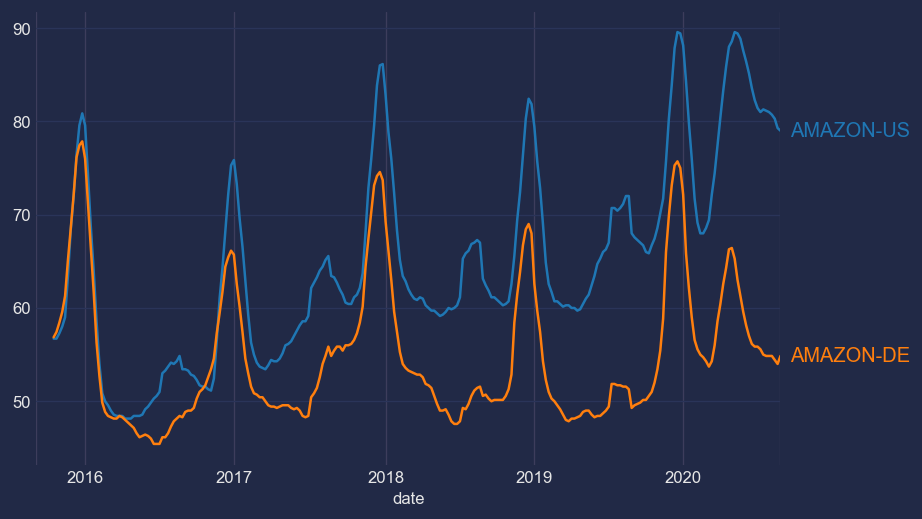

In [9]:
KEYWORDS = ['AMAZON', 'TESLA']
COUNTRY = ['US', 'DE']

pytrend = TrendReq(hl='en-US', tz=360)
CODES = pd.DataFrame([pytrend.suggestions(keyword=i)[0] for i in KEYWORDS])
EXACT_KEYWORDS = CODES['mid'].to_list()
CATEGORY = 0  # Use this link to select categories
SEARCH_TYPE = ''  # default is 'web searches',others include 'images','news','youtube',
# 'froogle' (google shopping)
Individual_EXACT_KEYWORD = list(zip(*[iter(EXACT_KEYWORDS)] * 1))
Individual_EXACT_KEYWORD = [list(x) for x in Individual_EXACT_KEYWORD]
dicti = {}
i = 1
for Country in COUNTRY:
    for keyword in Individual_EXACT_KEYWORD:
        pytrend.build_payload(kw_list=keyword,
                              timeframe='today 5-y',
                              geo=Country,
                              cat=CATEGORY,
                              gprop=SEARCH_TYPE)
        dicti[i] = pytrend.interest_over_time()
        i += 1

df_trends = pd.concat(dicti, axis=1)
df_trends.columns = df_trends.columns.droplevel(0)  # drop outside header
df_trends = df_trends.drop('isPartial', axis=1)  # drop "isPartial"
df_trends.reset_index(level=0, inplace=True)  # reset_index

col = ['date']
for country in COUNTRY:
    for name in KEYWORDS:
        col.append(name + '-' + country)
df_trends.columns = col
df_trends.index = df_trends['date']
df_trends.drop('date', axis=1, inplace=True)

ax = df_trends[['AMAZON-US',
                'AMAZON-DE']].rolling(7).mean().plot(figsize=(8, 5),
                                                     legend=False)
ax.grid(color='#2A3459')
ax.xaxis.grid(color='#3d3d5c')

for line, name in zip(ax.lines, df_trends[['AMAZON-US', 'AMAZON-DE']]):
    y = line.get_ydata()[-1]
    ax.annotate(name,
                xy=(1, y),
                xytext=(6, 0),
                color=line.get_color(),
                xycoords=ax.get_yaxis_transform(),
                textcoords="offset points",
                size=12,
                va="center")

**Yearly periodicity: Every year raise in December/January and drop in February. Except this year! Any idea what have caused this?**

**COVID-19 has a big influence on us!**

**Correlation to stock market share price?**

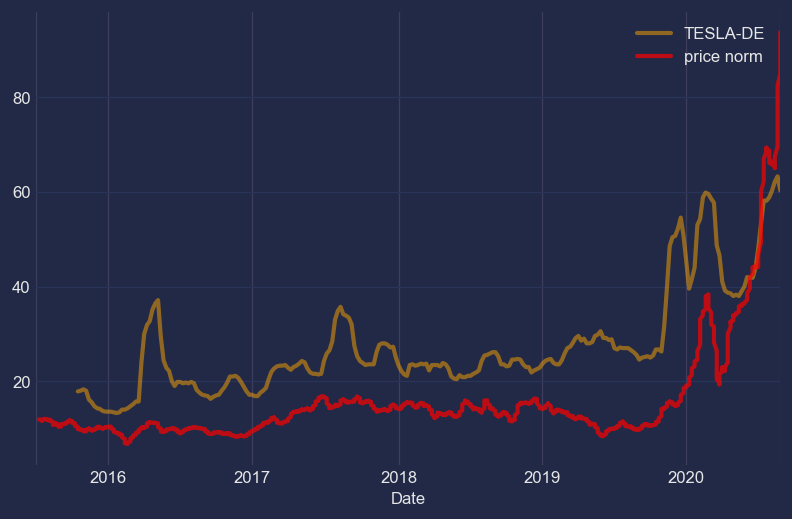

In [10]:
start_date = '2015-07-01'
end_date = '2020-08-28'
# Set the ticker
ticker = 'TSLA'

# Get the data
charts = data.get_data_yahoo(ticker, start_date, end_date)
charts['Adj_Close_nor'] = charts['Adj Close'] / charts['Adj Close'].max() * 100
ax = df_trends[['TESLA-DE']].rolling(7).mean().plot(alpha=0.5,
                                                    figsize=(8, 5),
                                                    linewidth=2.5,
                                                    color='orange')
ax.grid(color='#2A3459')
charts['Adj_Close_nor'].rolling(7).mean().plot(ax=ax,
                                               label='price norm',
                                               color='red',
                                               alpha=.7,
                                               linewidth=2.5)
ax.legend()
ax.grid(color='#2A3459')
ax.xaxis.grid(color='#3d3d5c')

## Covid-19 data

**Questions**:
- Which **countries are affected the most**? How to measure it? 
- Where are **'safe places' for traveling**?
- Can we **find structure/patterns** in the data?

**Data from the Johns Hopkins University (https://coronavirus.jhu.edu/map.html).**
This page is really slow and only allows limited comparison. So let's import them.

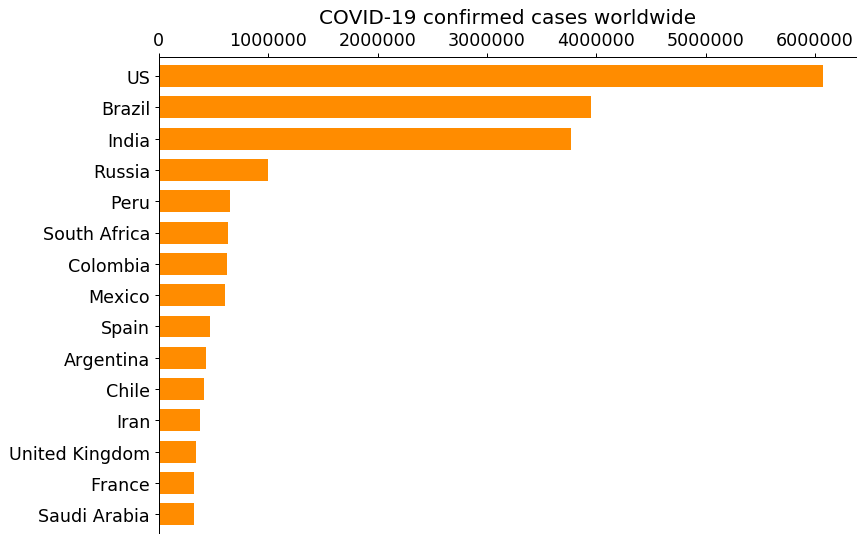

In [11]:
mpl.rcParams.update(mpl.rcParamsDefault)
%matplotlib inline
mpl.rcParams['font.size'] = 14
mpl.rcParams['figure.dpi'] = 90.
ax = cases.iloc[:, -1].head(15).plot(kind='barh',
                                     figsize=(10, 7),
                                     width=0.7,
                                     color='darkorange')
ax.set_title('COVID-19 confirmed cases worldwide', fontsize=16)
ax.spines['bottom'].set_visible(False)
ax.spines['right'].set_visible(False)
plt.gca().invert_yaxis()
ax.xaxis.tick_top();

**Difficult to compare countries with different size and population.**

### So let's normalize to population

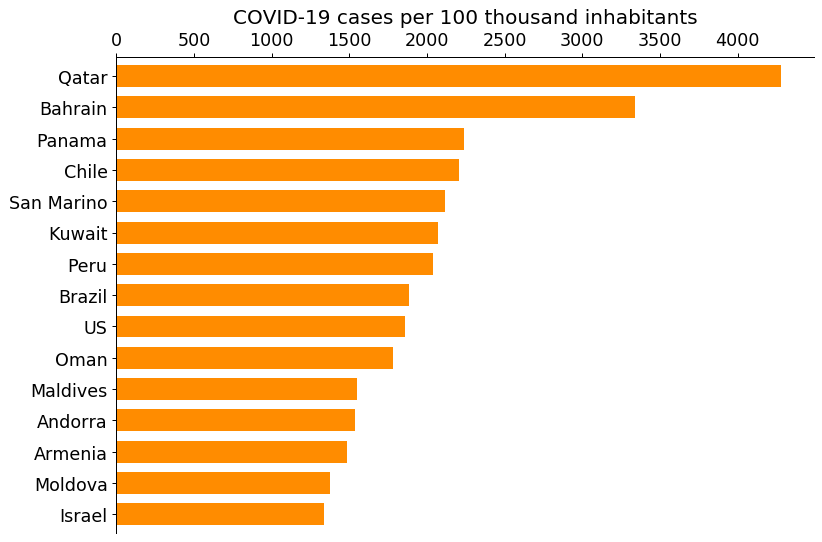

In [12]:
ax = cases_pT.iloc[:, -1].head(15).plot(kind='barh',
                                        figsize=(10, 7),
                                        width=0.7,
                                        color='darkorange')
ax.set_title('COVID-19 cases per 100 thousand inhabitants', fontsize=16)
ax.spines['bottom'].set_visible(False)
ax.spines['right'].set_visible(False)
plt.gca().invert_yaxis()
ax.xaxis.tick_top();

**What about the testing rate?** There might be much more cases in some countries; due to poor testing rate those might be uncounted. A better measure would be the number of deaths normalized to populations.

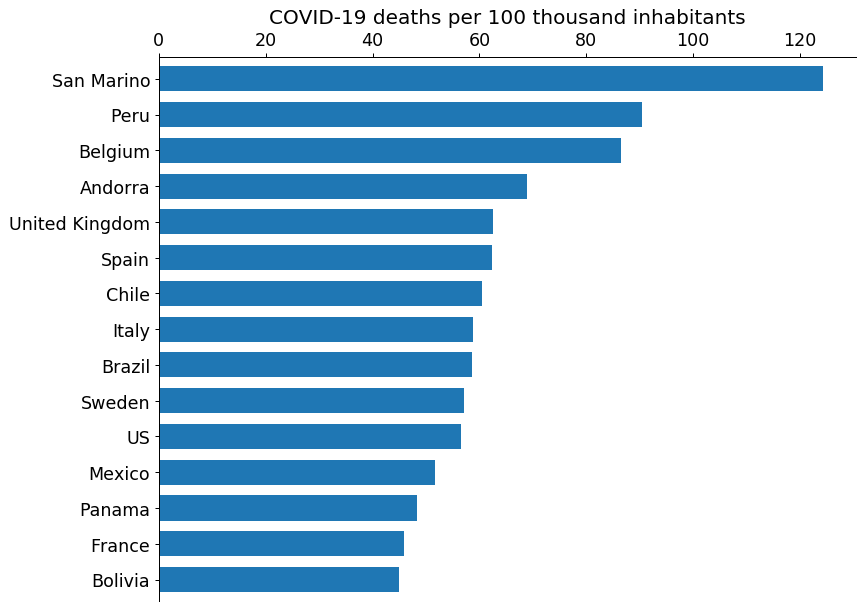

In [13]:
deaths_pT.sort_values([last_day], ascending=False, axis=0, inplace=True)

ax = deaths_pT.iloc[:, -1].head(15).plot(kind='barh',
                                         figsize=(10, 8),
                                         width=0.7)
ax.set_title('COVID-19 deaths per 100 thousand inhabitants', fontsize=16)
ax.spines['bottom'].set_visible(False)
ax.spines['right'].set_visible(False)
plt.gca().invert_yaxis()
ax.xaxis.tick_top();

Let us next take a look at the dynamical behavior of daily COVID-19 deaths. 

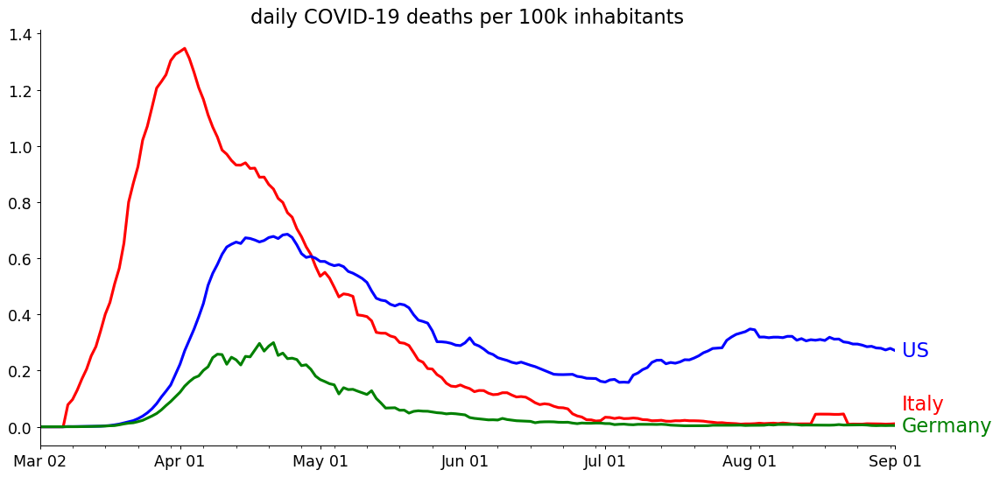

In [14]:
countries = ['Italy', 'US', 'Germany']

delay_days = 40
colors = ['red', 'blue', 'green']
for country, col in zip(countries, colors):
    ax2 = deaths_pT_new.loc[country][delay_days:].rolling(7).mean().fillna(
        0).plot(kind='line',
                linewidth=2.5,
                label=country,
                figsize=(14, 7),
                color=col)
ax2.xaxis.set_major_formatter(mdates.DateFormatter('%b %d'))
ax2.set_title('daily COVID-19 deaths per 100k inhabitants', fontsize=18)
ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)
# ax2.legend()
for line, name, sett in zip(ax2.lines, countries, [0.07, 0, 0.0]):
    y = line.get_ydata()[-1]
    ax2.annotate(name,
                 xy=(1, y + sett),
                 xytext=(6, 0),
                 color=line.get_color(),
                 xycoords=ax2.get_yaxis_transform(),
                 textcoords="offset points",
                 size=18,
                 va="center")

We see that there are different characteristics in those curves:
- some countries have a high number of deaths in the first COVID-19 'wave' but then they managed to go back to normality
- other countries are constantly suffering COVID-19 deaths over the time
- ...  

In the next sections we will apply a ML clustering technique to find out of all the 184 daily deaths curves, 3 categories.

### Finding structure: ML Cluster 184 countries -- deaths per inhabitants 

**If we ask our clustering algorithm to divide all curves into three categories, what 3 main types of curves will be found? How will those be distributed over the world? Is there any structure?**

COVID-19 deaths vs time curves
Euclidean k-means
5.078 --> 3.453 --> 3.326 --> 3.281 --> 3.271 --> 3.260 --> 3.255 --> 3.255 --> 


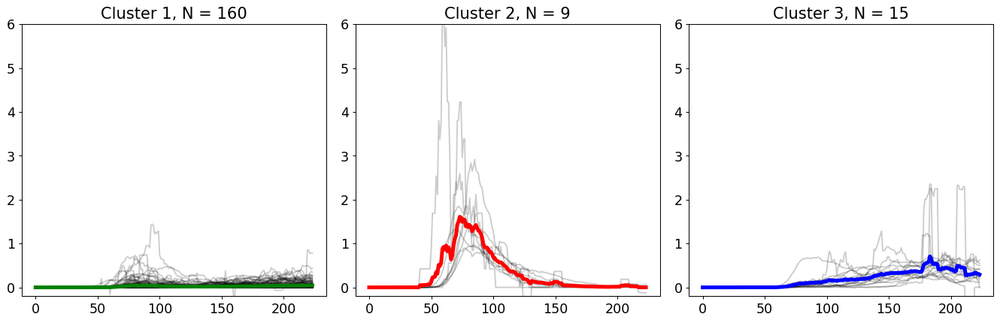

In [15]:
cluster = 3
df = deaths_pT_new
data_set = df.rolling(7, axis=1, min_periods=1).mean().fillna(0).values
colors = ['green', 'red', 'blue']

seed = 3
np.random.seed(seed)
X_train = to_time_series_dataset(data_set.copy())

# Euclidean k-means
print("COVID-19 deaths vs time curves")
print("Euclidean k-means")
km = TimeSeriesKMeans(n_clusters=cluster, verbose=True, random_state=seed)

y_pred = km.fit_predict(X_train)

plt.figure(figsize=(15, 5))
for yi in range(cluster):
    plt.subplot(1, cluster, yi + 1)
    for xx in X_train[y_pred == yi]:
        plt.plot(xx.ravel(), "k-", alpha=.2)
    plt.plot(km.cluster_centers_[yi].ravel(),
             "-",
             color=colors[yi],
             linewidth=4.)
    plt.ylim(-0.2, 6)
    n = len(X_train[y_pred == yi])
    plt.title("Cluster {}, N = {}".format(yi + 1, n))
clusters = pd.Series(data=y_pred, index=df.index)
plt.tight_layout()

So we find three clusters:
- green: 160 countries with a  low number of deaths over time, always returning close to zero
- red: too much deaths at the first wave, but now returned to normality (9 countries)
- blue: countries that have a raising number of deaths over the time.

**How these clusters are distributed  over the world?**

In [16]:
world = Map()
for name in coord.index:
    CircleMarker([coord.loc[name].lat, coord.loc[name].long],
                 popup=Popup(max_width=450).add_child(
                     Vega(coord.loc[name].json, width=450, height=250)),
                 color=colors[clusters.loc[name]],
                 radius=5,
                 fill=True,
                 opacity=0.7).add_to(world)
world

You can zoom in the map and click on the countries. There you see the curves normalized to 100k inhabitants for daily infections and daily deaths (multiplied by 10).

### Finding structures/patterns in data 2.

**Relation between daily infections and deaths?**

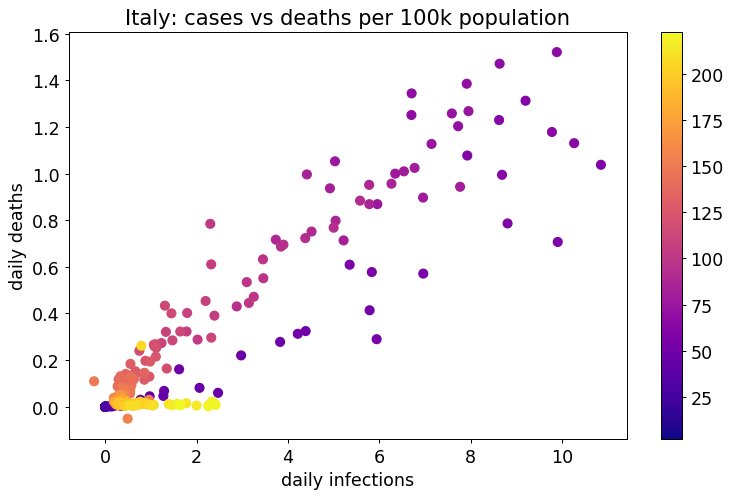

In [17]:
# daily is a DataFrame containing two columns, daily_cases and daily_deaths in country
country = 'Italy'
daily = cases_pT_new.loc[[country]].transpose()
daily.rename(columns={country: 'daily_cases'}, inplace=True)
daily['daily_deaths'] = deaths_pT_new.loc[country].shift(periods=1)

# try with 1 and with 7 can you see the pattern in time?
window = 1
time = range(len(daily.index))
cmap = mpl.cm.get_cmap('plasma')
fig, ax = plt.subplots()
daily.rolling(window, center=True).mean().plot(kind='scatter',
                                               x='daily_cases',
                                               y='daily_deaths',
                                               c=time,
                                               s=50,
                                               cmap=cmap,
                                               ax=ax,
                                               figsize=(10, 6),
                                               title=country)
plt.title('Italy: cases vs deaths per 100k population')
plt.xlabel('daily infections')
plt.ylabel('daily deaths');

There seems to be a linear relation between the two. The color indicates the time, dark is the past (FEB) and yellow the present. If we apply a average over 7 days, we find the following structure:

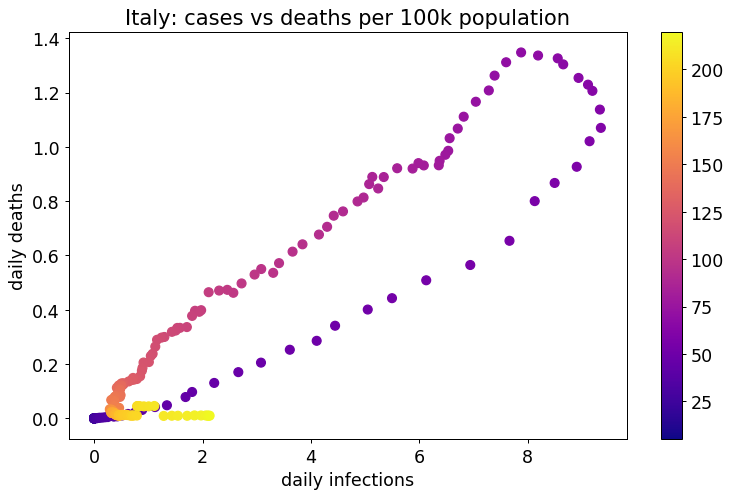

In [18]:
# try with 1 and with 7 can you see the pattern in time?
window = 7
time = range(len(daily.index))
cmap = mpl.cm.get_cmap('plasma')
fig, ax = plt.subplots()
daily.rolling(window, center=True).mean().plot(kind='scatter',
                                               x='daily_cases',
                                               y='daily_deaths',
                                               c=time,
                                               s=50,
                                               cmap=cmap,
                                               ax=ax,
                                               figsize=(10, 6),
                                               title=country)
plt.title('Italy: cases vs deaths per 100k population')
plt.xlabel('daily infections')
plt.ylabel('daily deaths');

One can also try to incoorporate the delay between infection and death. Therefore change the parameter 'periods' in the following line, two blocks above.
>daily['daily_deaths'] = deaths_pT_new.loc[country].shift(periods=1)

peak of daily cases 2020-03-21 00:00:00
peak of daily deaths 2020-03-27 00:00:00


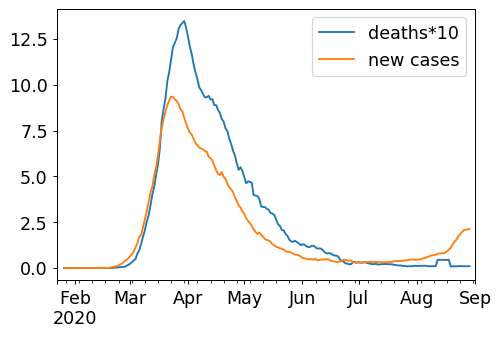

In [19]:
(10 * deaths_pT_new.loc['Italy']).rolling(
    7, center=True).mean().plot(label='deaths*10')
cases_pT_new.loc['Italy'].rolling(7,
                                  center=True).mean().plot(label='new cases')
plt.legend()
print(f'peak of daily cases {cases_pT_new.loc["Italy"].idxmax()}')
print(f'peak of daily deaths {deaths_pT_new.loc["Italy"].idxmax()}')

### Planning to Travel? Current Covid-19 Hotspots (last 8 days)

**New Infections**

In [20]:
world = Map()
df_2 = cases_pT_new.iloc[:, -8:].sum(axis=1)
for name in coord.index:
    if df_2[name] < 0:
        value = 1
    else:
        value = df_2[name]
    Circle([coord.loc[name].lat, coord.loc[name].long],
           color='red',
           popup=name,
           radius=4000 * value,
           fill=True,
           opacity=0.2).add_to(world)
world

**daily deaths hotspots**

In [21]:
world = Map()
df_2 = 50 * deaths_pT_new.iloc[:, -8:].sum(axis=1)
for name in coord.index:
    if df_2[name] < 0:
        value = 1
    else:
        value = df_2[name]
    Circle([coord.loc[name].lat, coord.loc[name].long],
           color='blue',
           popup=name,
           radius=4000 * value,
           fill=True,
           opacity=0.3).add_to(world)
world

## APIs: Publication info --  SCOPUS

**POWERFUL: Python Modules**

What about receiving all information found on Scopus for Prof. Cuniberti? 

In [22]:
author = AuthorRetrieval('9-s2.0-56273831400')   # receive data for Prof. Cuniberti
print (author)

Cuniberti G. from Center for Advancing Electronics Dresden,
published 408 document(s) since 1996 in 179 distinct source(s),
which were cited by 7,301 author(s) in 9,148 document(s)


In [23]:
# get all documents
author_docs = pd.DataFrame(author.get_documents())
author_docs.columns

Index(['eid', 'doi', 'pii', 'pubmed_id', 'title', 'subtype',
       'subtypeDescription', 'creator', 'afid', 'affilname',
       'affiliation_city', 'affiliation_country', 'author_count',
       'author_names', 'author_ids', 'author_afids', 'coverDate',
       'coverDisplayDate', 'publicationName', 'issn', 'source_id', 'eIssn',
       'aggregationType', 'volume', 'issueIdentifier', 'article_number',
       'pageRange', 'description', 'authkeywords', 'citedby_count',
       'openaccess', 'fund_acr', 'fund_no', 'fund_sponsor'],
      dtype='object')

In [24]:
# abstract
author_docs.description[0]

'© 2020 The Japan Society of Applied Physics. The enormous amount of data generated nowadays worldwide is increasingly triggering the search for unconventional and more efficient ways of processing and classifying information, eventually able to transcend the conventional von Neumann-Turing computational central dogma. It is, therefore, greatly appealing to draw inspiration from less conventional but computationally more powerful systems such as the neural architecture of the human brain. This neuromorphic route has the potential to become one of the most influential and long-lasting paradigms in the field of unconventional computing. Memristive and the recently proposed memfractive systems have been shown to display basic features of neural systems such as synaptic-like plasticity and memory features, so that they may offer a diverse playground to implement synaptic connections. In this review, we address various material-based strategies of implementing unconventional computing hardw

**How to get an overview about the topics our Chair has been working on over the last years?**
We could for example take all the abstracts of all 408 articles and make a wordcloud out of them.

Let us create a string that joins all the abstracts from all articles:

In [25]:
string = ''
for num in author_docs.index:
    txt = author_docs.iloc[num].description
    if txt != None:
        if txt[0] == '©' or 'Copyright' in txt[
                0:15] or 'c○' in txt[:5] or 'COPYRIGHT' in txt[
                    0:15] or 'This journal is' in txt[:30]:
            if txt.find('Weinheim') != -1:
                string = string + txt[txt.find('Weinheim') + 8:] + '\n'
            elif txt.find('Switzerland') != -1:
                string = string + txt[txt.find('Switzerland') + 11:]
            else:
                string = string + txt[txt.find('.') + 1:] + '\n'
        else:
            if '©' in txt[-100:]:
                string = string + txt[:txt.find('©')] + '\n'
            else:
                string = string + txt + '\n'
    else:
        string = string + author_docs.iloc[num].title + '\n'
author_string_description = string

Let's make the word cloud!

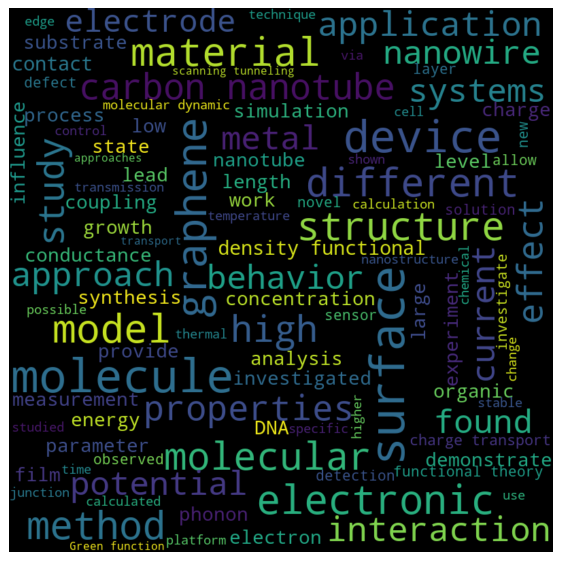

In [26]:
#normal wordcloud
stopword = set(STOPWORDS)
# add some words to the stopwords (words we dont want to be shown in the wordcloud)
stop_words = list(STOPWORDS) + [
    'value', 'results', 'result', 'single', 'thus', 'within', 'one', 'two',
    'well', 'show', 'presence', 'using', 'based', 'used', 'system', 'obtained',
    'due', 'present'
]
wordcloud = WordCloud(stopwords=stop_words,
                      width=800,
                      height=800,
                      margin=0,
                      background_color="black",
                      max_words=100,
                      min_font_size=6,
                      max_font_size=70).generate(string)

plt.figure(figsize=(12, 8))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.margins(x=0, y=0)

And bring it in 'shape'!

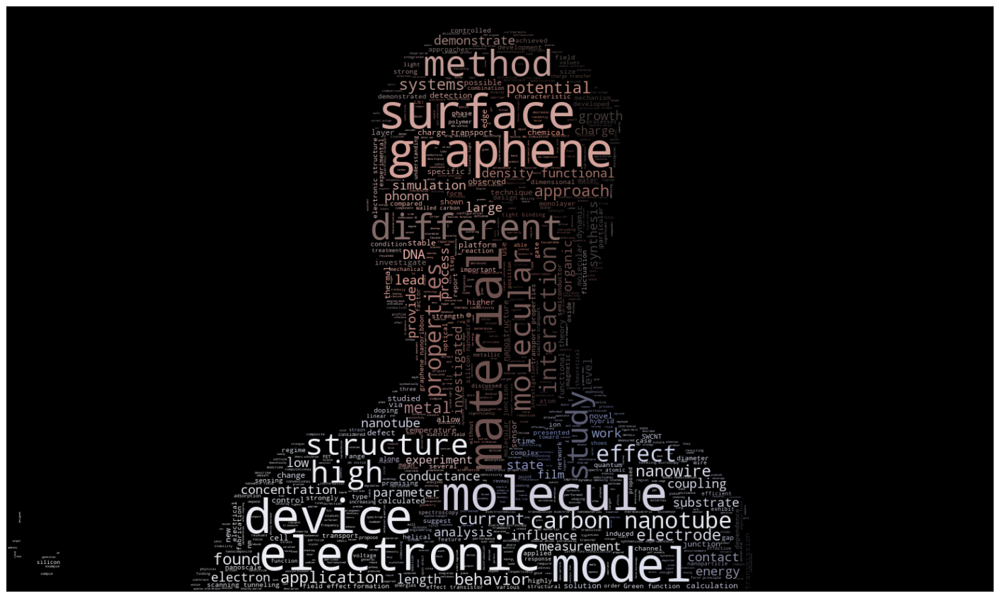

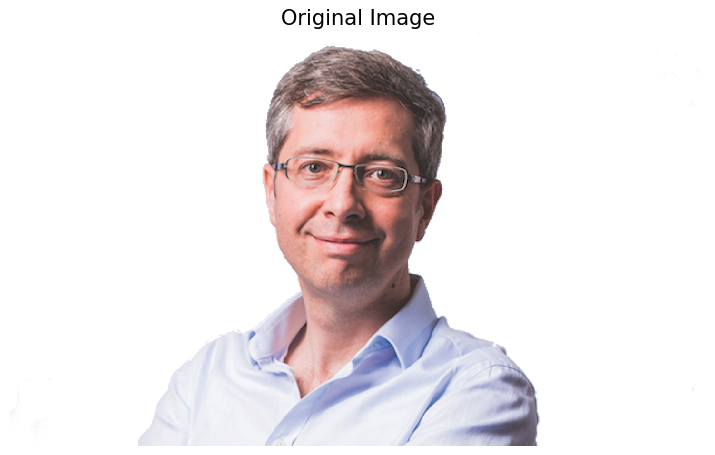

In [27]:
mask_color = np.array(Image.open('data/Gianaurelio_Cuniberti_3.png'))
mask = mask_color.copy()  # create mask white is "masked out"
mask[mask.sum(axis=2) == 0] = 255
# some finesse: we enforce boundaries between colors so they get less washed out.
# For that we do some edge detection in the image
edges = np.mean([
    gaussian_gradient_magnitude(mask_color[:, :, i] / 255., 2)
    for i in range(3)
],
                axis=0)
mask[edges > .08] = 255

wc = WordCloud(stopwords=stop_words,
               mask=mask,
               random_state=42,
               relative_scaling=0,
               background_color='black',
               max_words=3000,
               min_font_size=4,
               max_font_size=70)
wc.generate(author_string_description)  # generate word cloud
image_colors = ImageColorGenerator(mask_color)  # create coloring from image
wc.recolor(color_func=image_colors)
plt.figure(figsize=(20, 20))
plt.axis('off')
plt.margins(x=0, y=0)
plt.imshow(wc, interpolation='bilinear')
plt.figure(figsize=(10, 10))
plt.axis('off')
plt.title('Original Image')
plt.imshow(mask_color);

## Summary

With a couple of lines of Python code:
- access many different data sources (exp. data, Google data, material databases, COVID-19 data, Scopus)
- analyze and visualize them

# **Python: powerful, easy to learn and very useful for scientists!**